In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
cd ../src

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/src


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.manifold import Isomap

from sklearn.preprocessing import StandardScaler
import plotly.express as px
from classes import FPU
from numpy import linalg as LA

# System inputs

In [4]:
NUM_ATOMS = 32  # number of particles equals to N in FPUT equations
T_MAX = 30000   # maximum time of simulation
INTEGRATION_TIME_STEP = 0.1
INITIAL_MODE_NUMBER = 1
NUM_MODES = 3  # number of modes to be observed
ALPHA_REF = 1
BETA_REF = 2

# Run FPU with verlet algo


## 1. Using alpha=0, beta=0 -> No Ergodicity

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7499/7499 [00:02<00:00, 2865.92it/s]


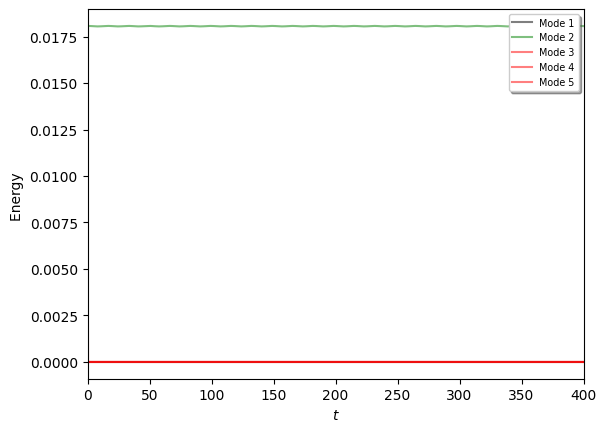

In [5]:
INITIAL_MODE_AMPLITUDE = 1

fpu = FPU(
    num_atoms=NUM_ATOMS,
    num_modes=5,
    initial_mode_number=2,
    initial_mode_amplitude=INITIAL_MODE_AMPLITUDE,
    t_step=0.4,
    t_max=T_MAX/10,
    alpha=0.0,
    beta=0.0
)

time_steps, q, p, mode_energies = fpu.run(method="verlet")

plt.plot(time_steps, mode_energies[0, :],'k-', linewidth=1.5, label='Mode 1', alpha=0.5)
plt.plot(time_steps, mode_energies[1, :],'g-', linewidth=1.5, label='Mode 2', alpha=0.5)
plt.plot(time_steps, mode_energies[2, :],'r-', linewidth=1.5, label='Mode 3', alpha=0.5)
plt.plot(time_steps, mode_energies[3, :],'r-', linewidth=1.5, label='Mode 4', alpha=0.5)
plt.plot(time_steps, mode_energies[4, :],'r-', linewidth=1.5, label='Mode 5', alpha=0.5)
plt.xlim(0, 400)
plt.xlabel('$t$ ')
plt.ylabel('Energy ')
legend = plt.legend(loc='upper right', shadow=True, fontsize='x-small')
plt.show()

### Isomap

In [6]:
scaler = StandardScaler()

X = np.concatenate([q.T, p.T], axis=1)
X = scaler.fit_transform(X)

model = Isomap(n_components=10)

X_tr = model.fit_transform(X)

### A scatter plot of the first p and q

Text(0.5, 1.0, 'q_0 vs q_o. Init amp = 1')

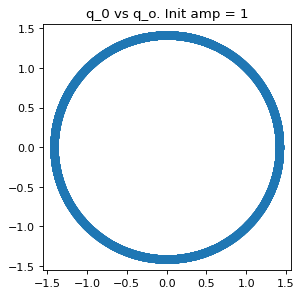

In [8]:
plt.figure(figsize=(4, 4), dpi=80)
plt.scatter(X[:, 0], X[:, 32])
plt.title("q_0 vs q_o. Init amp = 1")

### A scatter plot of the first two projected components

Text(0.5, 1.0, 'PC1 vs PC2. Init amp = 1')

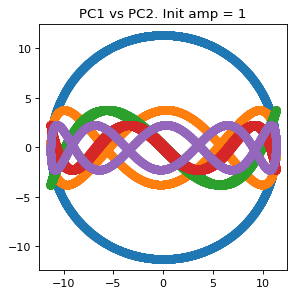

In [9]:
plt.figure(figsize=(4, 4), dpi=80)
plt.scatter(X_tr[:, 0], X_tr[:, 1])
plt.scatter(X_tr[:, 0], X_tr[:, 2])
plt.scatter(X_tr[:, 0], X_tr[:, 3])
plt.scatter(X_tr[:, 0], X_tr[:, 4])
plt.scatter(X_tr[:, 0], X_tr[:, 5])
plt.title("PC1 vs PC2. Init amp = 1")

In [10]:
df = pd.DataFrame(X_tr, columns=[f"x_tr_{i}" for i in range(X_tr.shape[1])])
fig = px.scatter_3d(df, x='x_tr_0', y='x_tr_1', z='x_tr_8')
fig.show()

...

## 2. Using low initial mode amplitude -> No ergodicity

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 37499/37499 [00:09<00:00, 3875.61it/s]


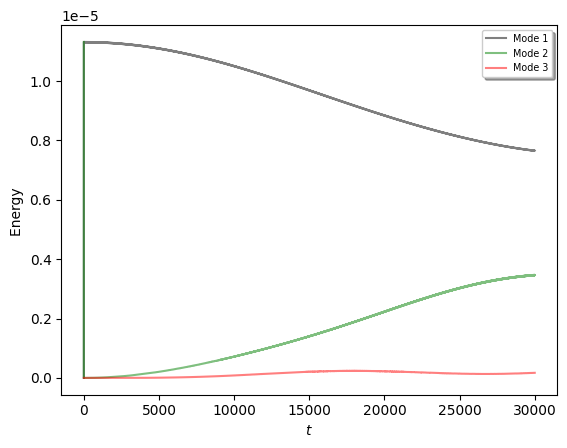

In [11]:
INITIAL_MODE_AMPLITUDE = 0.05

fpu = FPU(
    num_atoms=NUM_ATOMS,
    num_modes=NUM_MODES,
    initial_mode_number=INITIAL_MODE_NUMBER,
    initial_mode_amplitude=INITIAL_MODE_AMPLITUDE,
    t_step=0.8,
    t_max=T_MAX,
    alpha=ALPHA_REF,
    beta=BETA_REF
)

time_steps, q, p, mode_energies = fpu.run(method="verlet")

plt.plot(time_steps, mode_energies[0, :],'k-', linewidth=1.5, label='Mode 1', alpha=0.5)
plt.plot(time_steps, mode_energies[1, :],'g-', linewidth=1.5, label='Mode 2', alpha=0.5)
plt.plot(time_steps, mode_energies[2, :],'r-', linewidth=1.5, label='Mode 3', alpha=0.5)

plt.xlabel('$t$ ')
plt.ylabel('Energy ')
legend = plt.legend(loc='upper right', shadow=True, fontsize='x-small')
plt.show()

### Isomap

In [ ]:
scaler = StandardScaler()

X = np.concatenate([q.T, p.T], axis=1)
X = scaler.fit_transform(X)

model = Isomap(n_components=10)

X_tr = model.fit_transform(X)

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/sklearn/manifold/_isomap.py:348: UserWarning:

The number of connected components of the neighbors graph is 165 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. 

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/40_FPUT/fput/fpuvenv/lib/python3.9/site-packages/scipy/sparse/_index.py:103: SparseEfficiencyWarning:

Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.

/Users/alessandro.romualdi/projects/gionni/4

### A scatter plot of the first q and p

In [13]:
plt.figure(figsize=(4, 4), dpi=80)
plt.scatter(X_sample[:, 0], X_sample[:, 32])
plt.title("q_0 vs p_0. Init amp = 1")

NameError: name 'X_sample' is not defined

<Figure size 320x320 with 0 Axes>

In [ ]:
df = pd.DataFrame(X, columns=[f"x_{i}" for i in range(X.shape[1])])
fig = px.scatter_3d(df, x='x_0', y='x_32', z='x_10')
fig.show()

### A scatter plot of the first PCs

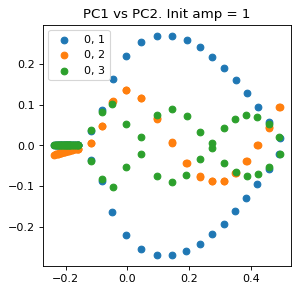

In [19]:
plt.figure(figsize=(4, 4), dpi=80)
plt.scatter(X_tr[:, 0], X_tr[:, 1], label="0, 1")
plt.scatter(X_tr[:, 0], X_tr[:, 2], label="0, 2")
plt.scatter(X_tr[:, 0], X_tr[:, 3], label="0, 3")
plt.title("PC1 vs PC2. Init amp = 1")
plt.legend()

In [31]:
"""
# PC1 vs PC2. Init amp = 1, different trajectory samples
fig, axs = plt.subplots(2, 2)

axs[0, 0].scatter(X_samples[0][:, 0], X_samples[0][:, 1])
axs[0, 1].scatter(X_samples[1][:, 0], X_samples[1][:, 1])
axs[1, 0].scatter(X_samples[2][:, 0], X_samples[2][:, 1])
axs[1, 1].scatter(X_samples[3][:, 0], X_samples[3][:, 1])
""";

In [32]:
df = pd.DataFrame(X_tr, columns=[f"pc_{i}" for i in range(X_tr.shape[1])])
fig = px.scatter_3d(df, x='pc_0', y='pc_1', z='pc_5')
fig.show()

...

## Using higher initial mode amplitude -> Ergodicity

100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 37499/37499 [00:16<00:00, 2273.73it/s]


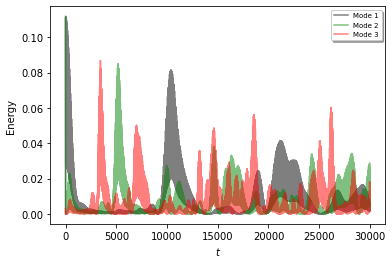

In [49]:
INITIAL_MODE_AMPLITUDE = 2.5

fpu = FPU(
    num_atoms=NUM_ATOMS,
    num_modes=NUM_MODES,
    initial_mode_number=INITIAL_MODE_NUMBER,
    initial_mode_amplitude=INITIAL_MODE_AMPLITUDE,
    t_step=0.8,
    t_max=T_MAX,
    alpha=ALPHA_REF,
    beta=BETA_REF
)

time_steps, q, p, mode_energies = fpu.run(method="verlet")

plt.plot(time_steps, mode_energies[0, :],'k-', linewidth=1.5, label='Mode 1', alpha=0.5)
plt.plot(time_steps, mode_energies[1, :],'g-', linewidth=1.5, label='Mode 2', alpha=0.5)
plt.plot(time_steps, mode_energies[2, :],'r-', linewidth=1.5, label='Mode 3', alpha=0.5)

plt.xlabel('$t$ ')
plt.ylabel('Energy ')
legend = plt.legend(loc='upper right', shadow=True, fontsize='x-small')
plt.show()

### Isomap

In [52]:
X = np.concatenate([q, p], axis=0)
model = Isomap(n_components=10)
X_tr = model.fit_transform(X)

### A scatter plot of the first p and q

Text(0.5, 1.0, 'q_0 vs q_o. Init amp = 1')

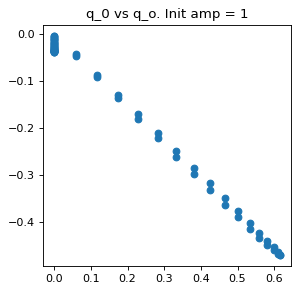

In [53]:
plt.figure(figsize=(4, 4), dpi=80)
plt.scatter(X[:, 0], X[:, 32])
plt.title("q_0 vs q_o. Init amp = 1")

In [54]:
df = pd.DataFrame(X, columns=[f"x_{i}" for i in range(X.shape[1])])
fig = px.scatter_3d(df, x='x_0', y='x_32', z='x_10')
fig.show()

Text(0.5, 1.0, 'PC1 vs PC2. Init amp = 1')

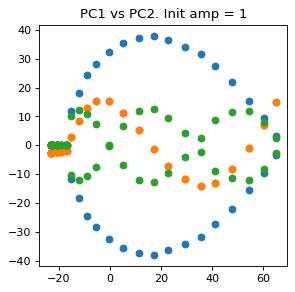

In [55]:
plt.figure(figsize=(4, 4), dpi=80)
plt.scatter(X_tr[:, 0], X_tr[:, 1])
plt.scatter(X_tr[:, 0], X_tr[:, 2])
plt.scatter(X_tr[:, 0], X_tr[:, 3])
plt.title("PC1 vs PC2. Init amp = 1")

In [71]:
df = pd.DataFrame(X_tr, columns=[f"pc_{i}" for i in range(X_tr.shape[1])])
fig = px.scatter_3d(df, x='pc_0', y='pc_1', z='pc_2')
fig.show()